In [1]:

import cv2
import math
import csv
import os
import matplotlib.pyplot as plt
from ultralytics import YOLO
from PIL import Image, ImageDraw, ImageFont
from ultralytics.solutions.solutions import BaseSolution
from ultralytics.utils.plotting import Annotator, colors
from datetime import datetime
%matplotlib inline



https://www.digitalocean.com/community/tutorials/what-is-new-with-yolo

## EJERCICIO 1 
Vamos a usar el modleo YOLOv11 para detectar objetos en una imagen (en este caso vamos a aplicar el modelo directamente sin entrenarlo).
Vamos a aplicarlo en las imagenes deteccion_objetos.jpg y bus.jpg

Partiendo de la imagen deteccion_objetos.jpg y bus.jpg.




0: 640x640 11 persons, 7 bicycles, 4 cars, 2 fire hydrants, 176.1ms
1: 640x640 4 persons, 1 bus, 176.1ms
Speed: 13.6ms preprocess, 176.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


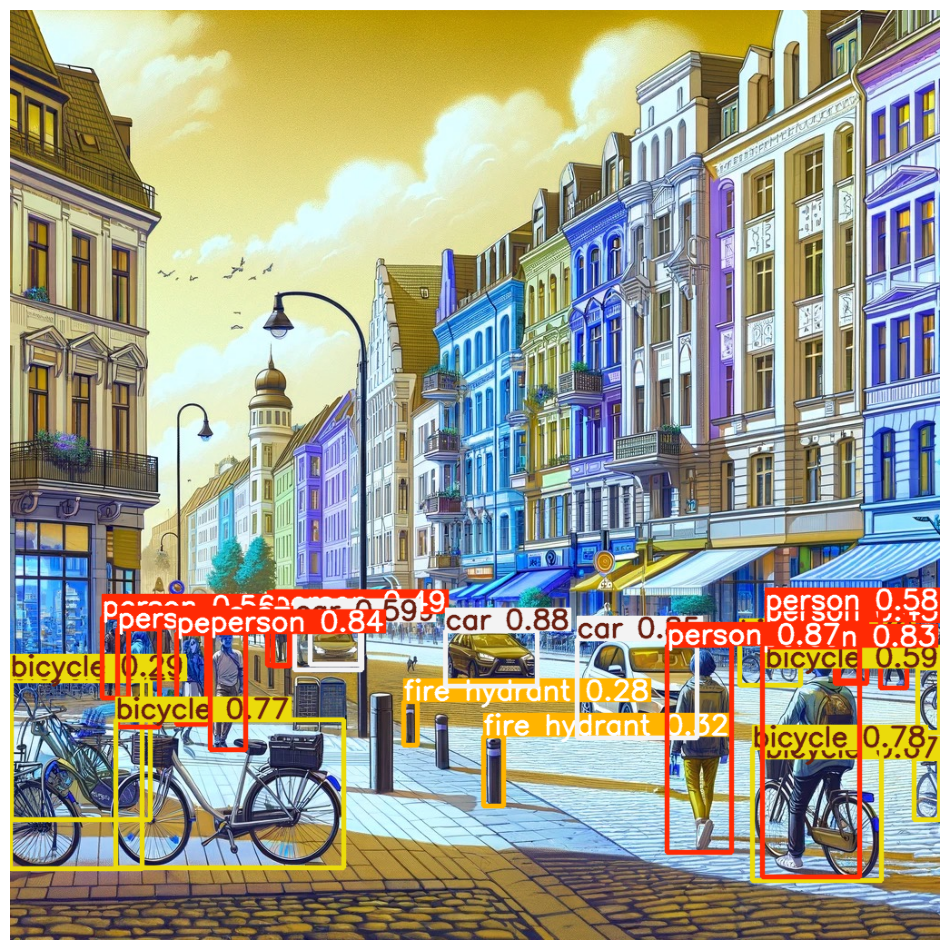

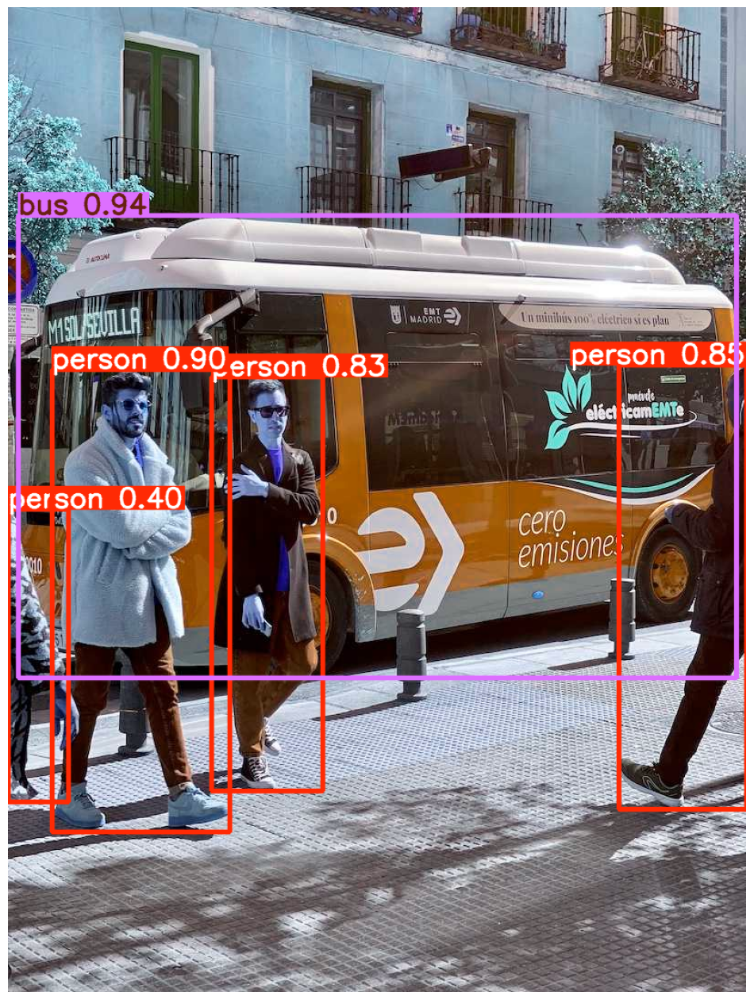

In [6]:
model = YOLO('yolo11n.pt')
image_paths = ["deteccion_objetos.jpg", "bus.jpg"]
results = model(image_paths)

for i,result in enumerate(results):
    image_with_boxes = results[i].plot()
    plt.figure(figsize=(12, 20)) 
    plt.imshow(image_with_boxes)
    plt.axis("off")  # Opcional: oculta los ejes
    plt.show()

## EJERCICIO 2
Vamos a repetir el ejercicio pero ahora vamos a modificar la salida para que quede de la siguiente forma:

![Imagen con la el resultado que se quiere obtener 1](Datos/deteccion_objetos_solucion.png)

![Imagen con la el resultado que se quiere obtener 1](Datos/bus_solucion.png)

Además sólo quiero que detecte los objetos cuya probabilidad sea mayor al 50%.

Ten en cuenta que al aplicar el modelo a una imagen devuelve diferentes datos:
 * Cajas:
    * Clase (cls)
    * Probabilidad (score)
    * Coordenadas de la caja xyxy

Para representar la imagen y añadir rectángulos, texto... puedes usar Image, ImageDraw, ImageFont de PIL. Dibujas la imagen con .Draw de (ImageDraw) con .rectangle y .text puedes ir añadiendo texto y rectángulos.


0: 640x640 11 persons, 7 bicycles, 4 cars, 2 fire hydrants, 129.1ms
1: 640x640 4 persons, 1 bus, 129.1ms
Speed: 3.9ms preprocess, 129.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


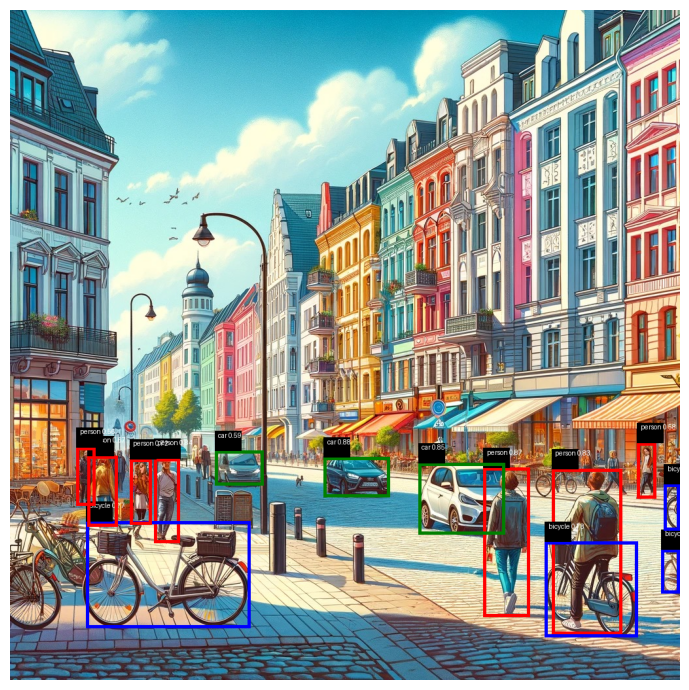

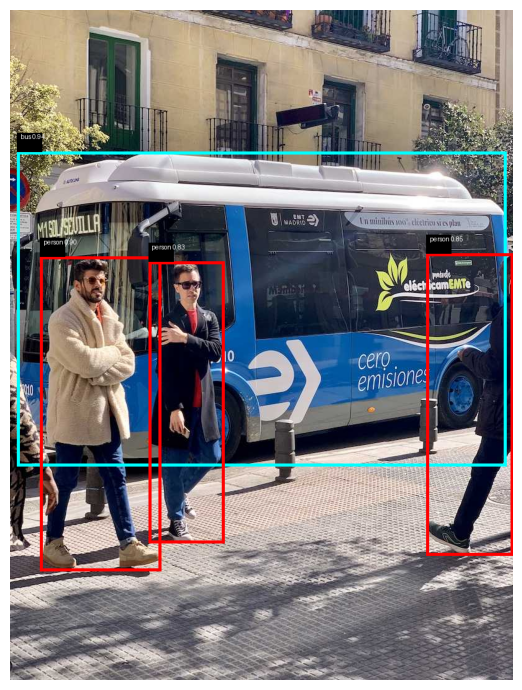

In [7]:
model = YOLO("yolo11n.pt")
image_paths = ["deteccion_objetos.jpg", "bus.jpg"]
results = model(image_paths)

for i, result in enumerate(results):
    detections = result.boxes
    filtered_detections = []

    for cls, score, box in zip(detections.cls, detections.conf, detections.xyxy):
        if score > 0.5:
            filtered_detections.append((cls, score, box))

    image = Image.open(image_paths[i]).convert("RGB")
    draw = ImageDraw.Draw(image)

    colors = ["red", "blue", "green", "orange", "purple", "cyan", "magenta", "yellow", "pink", "brown"]
    def get_color_for_class(cls_idx):
        return colors[cls_idx % len(colors)]

    for idx, (cls, score, box) in enumerate(filtered_detections, start=1):
        class_name = model.names[int(cls)]
        color = get_color_for_class(int(cls))

        draw.rectangle([box[0], box[1], box[2], box[3]], outline=color, width=5)
        draw.rectangle([box[0], box[1]-30, box[0]+40, box[1]], fill="black")
        draw.text((box[0]+5, box[1]-30), f"{class_name} {score:.2f}", fill="white")

    plt.figure(figsize=(13, 7))
    plt.imshow(image)
    plt.axis("off")
    plt.tight_layout()
    plt.show()


## EJERCICIO 3
YOLOv11 también sirve para segmentación, aplica segmentación a las dos imágenes con las que estamos trabajando


0: 640x640 11 persons, 9 bicycles, 3 cars, 1 backpack, 207.8ms
1: 640x640 4 persons, 1 bus, 207.8ms
Speed: 7.4ms preprocess, 207.8ms inference, 27.2ms postprocess per image at shape (1, 3, 640, 640)


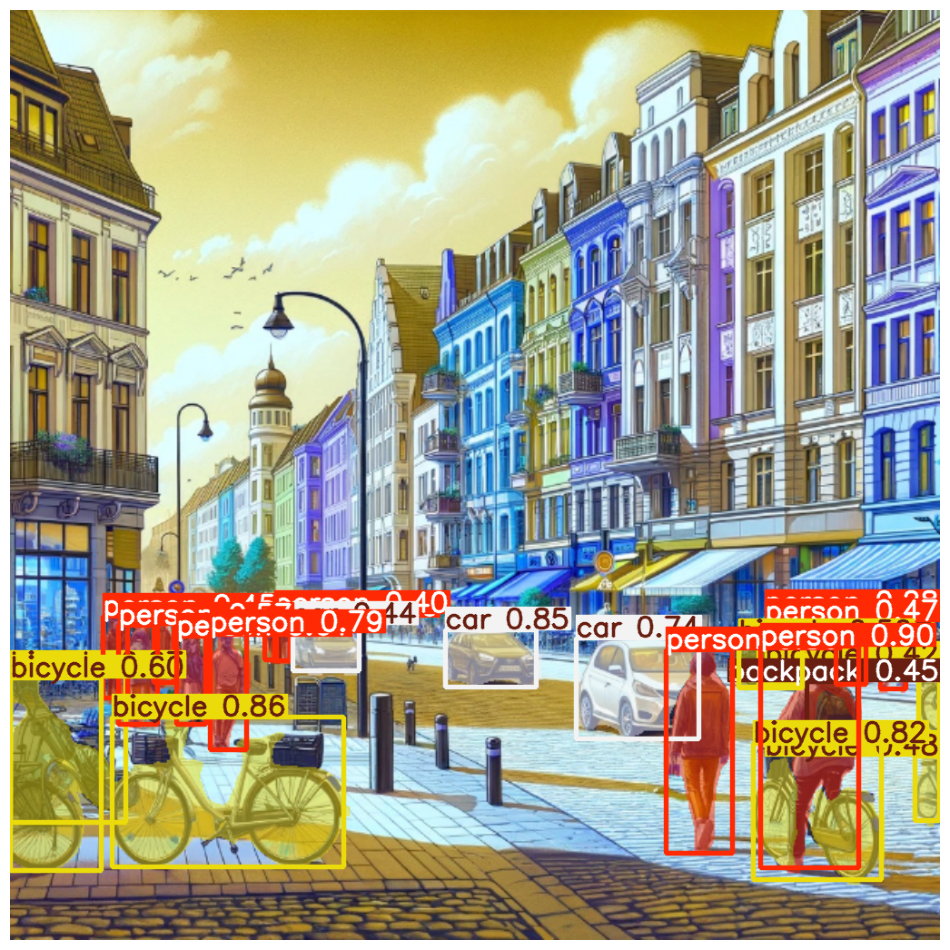

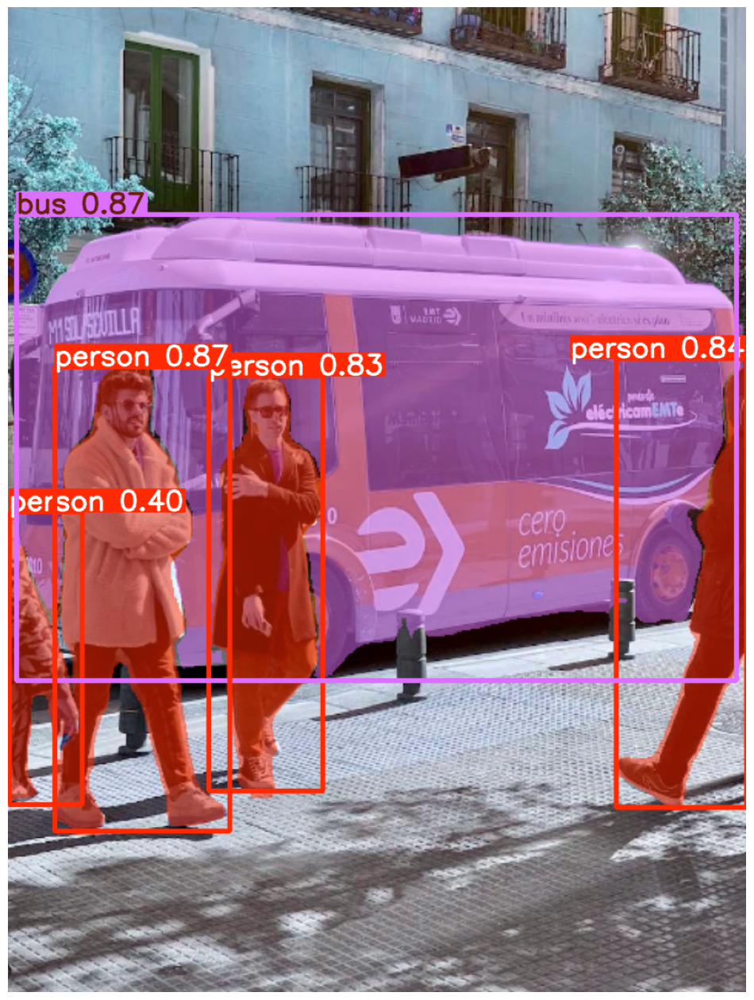

In [8]:
model = YOLO('yolo11n-seg.pt') 
image_paths = ["deteccion_objetos.jpg", "bus.jpg"]
results = model(image_paths)
for i,result in enumerate(results):
    image_with_boxes = results[i].plot()
    plt.figure(figsize=(12, 20)) 
    plt.imshow(image_with_boxes)
    plt.axis("off") 
    plt.show()

## EJERCICIO 4
De manera similar, podemos hacer la estimación de pose. Hazlo con las imágenes con las que estamos trabajando.


0: 640x640 2 persons, 196.6ms
1: 640x640 4 persons, 196.6ms
Speed: 4.9ms preprocess, 196.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


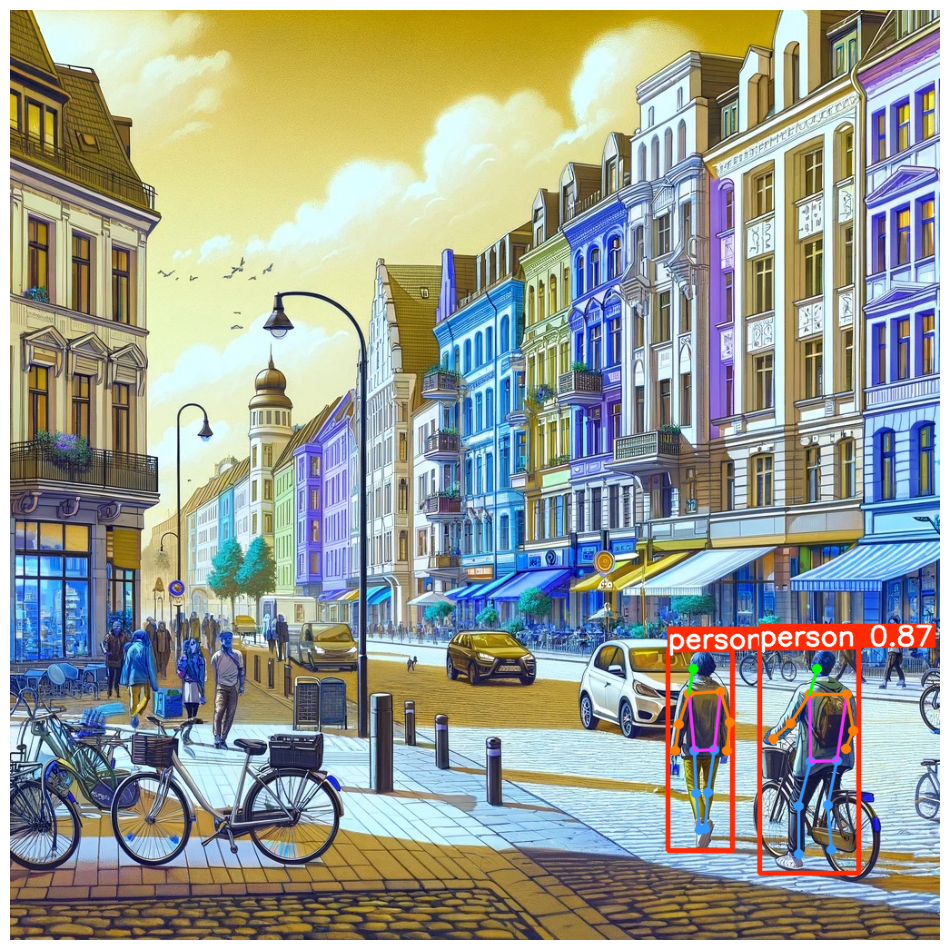

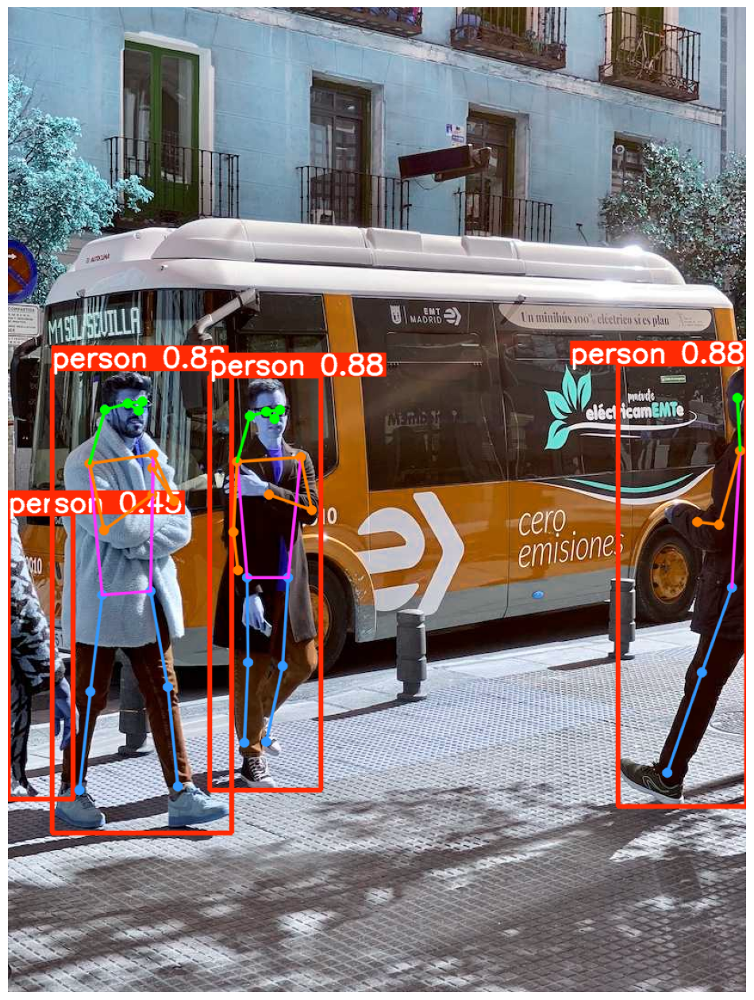

In [9]:
model = YOLO('yolo11n-pose.pt') 
image_paths = ["deteccion_objetos.jpg", "bus.jpg"]
results = model(image_paths)
for i,result in enumerate(results):
    image_with_boxes = results[i].plot()
    plt.figure(figsize=(12, 20)) 
    plt.imshow(image_with_boxes)
    plt.axis("off") 
    plt.show()

## EJERCICIO 5
Haz lo que se hace en el siguiente video:

https://www.youtube.com/watch?v=_YbEna8UNcU

Tienes parte del código en:

https://www.albertcoronado.com/2024/11/12/tutorial-yolo-11/

Para la parte fine tuning tienes que entrenar el modelo para que distina matrículas de coche, para entrenar el modelo utiliza el dataset que puedes descargar de:

https://universe.roboflow.com/parag-parmar-3qpin/car_license_plate-ypwmk/dataset/1

NOTA: HE CONSEGUIDO QUE FUNCIONE BIEN CV2 PERO ABRIENDO PRIMERO UNA IMAGEN:
```
img = cv2.imread('Datos/image3.jpg')
cv2.imshow("SAPA", img)
cv2.waitKey(0)
cv2.destroyAllWindows()
```


0: 640x480 1 cat, 179.0ms
Speed: 3.1ms preprocess, 179.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


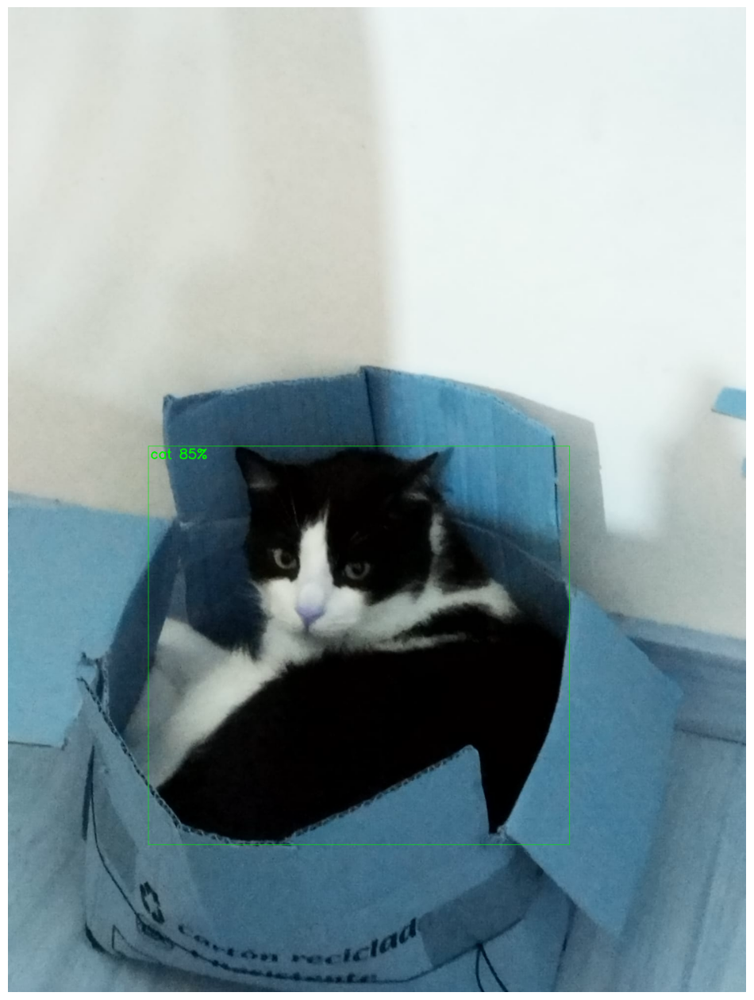

In [10]:
model = YOLO("yolo11n.pt")

font = cv2.FONT_HERSHEY_SIMPLEX
fontScale = 0.9
color = (0, 240, 0)
thickness = 2

img = cv2.imread('mika.jpg') 
results = model(img)

for r in results:
    for box in r.boxes:
        x1, y1, x2, y2 = box.xyxy[0]
        x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
        confidence = math.ceil((box.conf[0]*100))
        cv2.rectangle(img, ( x1, y1 ), ( x2, y2 ), color, 1)
        cv2.putText(img, r.names[ int( box.cls[0] ) ]+" "+str(confidence)+"%", [ x1+4, y1+25 ], font, fontScale, color, thickness)

cv2.imwrite('resultado.jpg', img)

plt.figure(figsize=(12, 20)) 
plt.imshow(img)
plt.axis("off") 
plt.show()

In [11]:

model = YOLO("yolo11x.pt")
cap = cv2.VideoCapture(0)

font = cv2.FONT_HERSHEY_SIMPLEX
fontScale = 0.7
color = (0, 250, 0)
thickness = 2

while True:
    success, img = cap.read()
    results = model( img, stream=True )

    for r in results:
        for box in r.boxes:
            x1, y1, x2, y2 = box.xyxy[0]
            x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)

            confidence = math.ceil((box.conf[0]*100))
            
            cv2.rectangle(img, ( x1, y1 ), ( x2, y2 ), color, 1)
            cv2.putText(img, r.names[ int( box.cls[0] ) ]+" "+str(confidence)+"%", [ x1+4, y1+25 ], font, fontScale, color, thickness)

    cv2.imshow('Webcam', img)

    if cv2.waitKey(1) == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()


0: 480x640 1 person, 1069.6ms
Speed: 2.0ms preprocess, 1069.6ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 1 bottle, 1217.6ms
Speed: 4.1ms preprocess, 1217.6ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 1 bottle, 1055.5ms
Speed: 3.1ms preprocess, 1055.5ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 1 bottle, 1154.0ms
Speed: 3.2ms preprocess, 1154.0ms inference, 2.5ms postprocess per image at shape (1, 3, 480, 640)


## EJERCICIO 6
Repite el fine tuning del apartado anterior pero ahora en vez de como un comando en la terminal con código de python

In [12]:
# Define rutas de entrada y salida
train_data = r"C:\Users\irune\Downloads\car_license_plate.v1i.yolov11\data.yaml"
train_model = 'yolo11x.pt'
train_project = 'predicciones'

predict_model = 'predicciones/train/weights/best.pt'
predict_source = 'carTest.jpg'
predict_output = 'predicciones'
conf_threshold = 0.35

print("Iniciando entrenamiento...")
model = YOLO(train_model)
model.train(
    data=train_data,
    epochs=50,
    batch=10,
    project=train_project
)
print("Entrenamiento completado.")

# Predicción
print("Iniciando predicción...")
model = YOLO(predict_model) 
results = model.predict(
    source=predict_source,
    project=predict_output,
    conf=conf_threshold,
    save=True
)
print("Predicción completada.")

for result in results:
    img = result.orig_img  # Imagen original
    for box in result.boxes:
        # Extraer coordenadas del cuadro delimitador
        x1, y1, x2, y2 = map(int, box.xyxy[0])  # Convertir a enteros
        label = f"{result.names[int(box.cls[0])]} {box.conf[0]*100:.2f}%"

        # Dibujar cuadros y etiquetas
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(img, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Mostrar imagen con predicciones
    cv2.imshow('Resultados', img)

    # Guardar resultados
    output_path = f"{predict_output}/predicted_image.jpg"
    cv2.imwrite(output_path, img)
    print(f"Resultados guardados en: {output_path}")

    plt.figure(figsize=(12, 20)) 
    plt.imshow(img)
    plt.axis("off") 
    plt.show()

    # Esperar para cerrar la ventana
    cv2.waitKey(0)
    cv2.destroyAllWindows()

Iniciando entrenamiento...
New https://pypi.org/project/ultralytics/8.3.74 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.70  Python-3.11.10 torch-2.6.0+cpu CPU (12th Gen Intel Core(TM) i7-1255U)
engine\trainer: task=detect, mode=train, model=yolo11x.pt, data=C:\Users\irune\Downloads\car_license_plate.v1i.yolov11\data.yaml, epochs=50, time=None, patience=100, batch=10, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=predicciones, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_n

100%|██████████| 755k/755k [00:00<00:00, 5.07MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1      2784  ultralytics.nn.modules.conv.Conv             [3, 96, 3, 2]                 
  1                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  2                  -1  2    389760  ultralytics.nn.modules.block.C3k2            [192, 384, 2, True, 0.25]     
  3                  -1  1   1327872  ultralytics.nn.modules.conv.Conv             [384, 384, 3, 2]              
  4                  -1  2   1553664  ultralytics.nn.modules.block.C3k2            [384, 768, 2, True, 0.25]     
  5                  -1  1   5309952  ultralytics.nn.modules.conv.Conv             [768, 768, 3, 2]              
  6                  -1  2   5022720  ultralytics.nn.modules.block.C3k2            [768, 768, 2, True]           
  7                  -1  1   5309952  ultralytics

train: Scanning C:\Users\irune\Downloads\car_license_plate.v1i.yolov11\train\labels... 210 images, 0 backgrounds, 0 corrupt: 100%|██████████| 210/210 [00:00<00:00, 333.99it/s]

train: New cache created: C:\Users\irune\Downloads\car_license_plate.v1i.yolov11\train\labels.cache



val: Scanning C:\Users\irune\Downloads\car_license_plate.v1i.yolov11\valid\labels... 60 images, 0 backgrounds, 0 corrupt: 100%|██████████| 60/60 [00:00<00:00, 248.89it/s]

val: New cache created: C:\Users\irune\Downloads\car_license_plate.v1i.yolov11\valid\labels.cache


Plotting labels to predicciones\train\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 167 weight(decay=0.0), 174 weight(decay=0.00046875), 173 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to predicciones\train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50         0G      1.615      4.614      1.463         24        640:  24%|██▍       | 5/21 [10:57<35:05, 131.58s/it]


KeyboardInterrupt: 

## EJERCICIO 7
Vamos a contar los pasajeros de un autobus.

Sigue las instrucciones del siguiente video:

https://www.youtube.com/watch?v=hTI0Aj__SLE

ELIMINA LOS COMENTARIOS QUE HAY EN EL CÓDIGO Y COMENTA EL CÓDIGO CON TUS PROPIAS PALABRAS


In [ ]:
class ObjectCounter(BaseSolution):
    """
    Clase para contar objetos en tiempo real en un video. 
    Cuenta objetos que cruzan una zona definida (línea o polígono).
    """

    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        
        # Contadores de objetos
        self.in_count = 0  # Objetos que entran
        self.out_count = 0  # Objetos que salen
        
        # IDs de los objetos rastreados
        self.counted_ids = []  # Ya contados
        self.saved_ids = []  # Guardados en CSV
        
        # Conteo por clases de objetos
        self.classwise_counts = {}  # Ej: {'persona': {'IN': 2, 'OUT': 1}}
        
        # Estado de la zona de conteo
        self.region_initialized = False  # Si la zona está lista o no
        
        # Opciones de visualización
        self.show_in = self.CFG.get("show_in", True)
        self.show_out = self.CFG.get("show_out", True)

    def save_label_to_csv(self, track_id, label, action):
        # Guarda la info en un CSV si el ID no está guardado
        if track_id in self.saved_ids:
            return  
        
        current_time = datetime.now().strftime("%Y-%m-%d %H:%M:%S")
        filename = f'tracked_objects_{datetime.now().strftime("%Y-%m-%d")}.csv'
        file_exists = os.path.isfile(filename)

        with open(filename, mode='a', newline='') as file:
            writer = csv.writer(file)
            if not file_exists:
                writer.writerow(['track_id', 'label', 'action', 'date', 'time'])
            writer.writerow([track_id, label, action, *current_time.split()])
            self.saved_ids.append(track_id)

    def count_objects(self, current_centroid, track_id, prev_position, cls):
        # Cuenta objetos si cruzan la zona de conteo
        if prev_position is None or track_id in self.counted_ids:
            return

        action = None 
        
        if len(self.region) == 2:  # Línea
            line = self.LineString(self.region)
            if line.intersects(self.LineString([prev_position, current_centroid])):
                if abs(self.region[0][0] - self.region[1][0]) < abs(self.region[0][1] - self.region[1][1]):
                    action = "IN" if current_centroid[0] > prev_position[0] else "OUT"
                else:
                    action = "IN" if current_centroid[1] > prev_position[1] else "OUT"
                self.counted_ids.append(track_id)
        
        elif len(self.region) > 2:  # Polígono
            polygon = self.Polygon(self.region)
            if polygon.contains(self.Point(current_centroid)):
                region_width = max(p[0] for p in self.region) - min(p[0] for p in self.region)
                region_height = max(p[1] for p in self.region) - min(p[1] for p in self.region)
                if region_width < region_height:
                    action = "IN" if current_centroid[0] > prev_position[0] else "OUT"
                else:
                    action = "IN" if current_centroid[1] > prev_position[1] else "OUT"
                self.counted_ids.append(track_id)
        
        if action:
            self.classwise_counts[self.names[cls]][action] += 1
            self.save_label_to_csv(track_id, f"{self.names[cls]} ID: {track_id}", action)

    def store_classwise_counts(self, cls):
        # Inicializa el conteo de una clase si no existe
        if self.names[cls] not in self.classwise_counts:
            self.classwise_counts[self.names[cls]] = {"IN": 0, "OUT": 0}

    def display_counts(self, im0):
        # Muestra el conteo en la imagen
        labels_dict = {
            key.capitalize(): f"{'IN ' + str(value['IN']) if self.show_in else ''} "
                           f"{'OUT ' + str(value['OUT']) if self.show_out else ''}".strip()
            for key, value in self.classwise_counts.items()
            if value["IN"] != 0 or value["OUT"] != 0
        }
        
        if labels_dict:
            self.annotator.display_analytics(im0, labels_dict, (104, 31, 17), (255, 255, 255), 10)

    def count(self, im0):
        # Procesa los datos y actualiza los conteos
        if not self.region_initialized:
            self.initialize_region()
            self.region_initialized = True
        
        self.annotator = Annotator(im0, line_width=self.line_width)
        self.extract_tracks(im0)
        self.annotator.draw_region(self.region, (104, 0, 123), self.line_width * 2)

        for box, track_id, cls in zip(self.boxes, self.track_ids, self.clss):
            self.store_tracking_history(track_id, box)
            self.store_classwise_counts(cls)
            label = f"{self.names[cls]} ID: {track_id}"
            self.annotator.box_label(box, label, colors(cls, True))
            
            current_centroid = ((box[0] + box[2]) / 2, (box[1] + box[3]) / 2)
            prev_position = self.track_history[track_id][-2] if len(self.track_history[track_id]) > 1 else None
            self.count_objects(current_centroid, track_id, prev_position, cls)
        
        self.display_counts(im0)
        self.display_output(im0)
        return im0


In [ ]:
# Función para obtener la posición del ratón en la ventana

def RGB(event, x, y, flags, param):
    if event == cv2.EVENT_MOUSEMOVE:  # Detecta el movimiento del ratón
        print(f"Ratón movido a: {[x, y]}")

# Cargar el video
cap = cv2.VideoCapture('1.mp4')

# Definir la zona donde se cuentan los objetos
region_points = [(386,103), (458, 499)]

# Configurar el contador de objetos
counter = ObjectCounter(
    region=region_points,  # Zona de conteo
    model="yolo11s.pt",  # Modelo de detección de objetos
    classes=[0],  # Detectar solo personas
    show_in=True,  # Mostrar entradas
    show_out=True,  # Mostrar salidas
    line_width=2,  # Grosor de las líneas
)

# Crear ventana y asignar la función del ratón
cv2.namedWindow('RGB')
cv2.setMouseCallback('RGB', RGB)

count = 0

while True:
    # Leer fotograma del video
    ret, frame = cap.read()
    if not ret:
        break  # Termina si no hay más fotogramas

    count += 1
    if count % 2 != 0:  # Procesar solo fotogramas pares
        continue

    frame = cv2.resize(frame, (1020, 500))  # Ajustar tamaño

    # Contar objetos en el fotograma
    frame = counter.count(frame)

    # Mostrar el fotograma procesado
    cv2.imshow("RGB", frame)
    if cv2.waitKey(1) & 0xFF == ord("q"):  # Salir al presionar 'q'
        break

# Liberar recursos y cerrar la ventana
cap.release()
cv2.destroyAllWindows()


## EJERCICIO 8
Adapta el código anterior para que cuente vehículos en el video vehicle-counting.mp4 (tiene que contar por separado coches y camiones)

In [ ]:
import cv2

# Cargar el video
cap = cv2.VideoCapture('datos/vehicle-counting.mp4')

# Obtener ancho y alto del video
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

print(f"Dimensiones del video: {width}x{height}")

# Liberar el video
cap.release()

# Función para el tracking del ratón
def RGB(event, x, y, flags, param):
    if event == cv2.EVENT_MOUSEMOVE:
        point = [x, y]
        print(f"Mouse moved to: {point}")

# Abrir el video
cap = cv2.VideoCapture('datos/vehicle-counting.mp4')

# Define región para contar
region_points = [(0, 255), (1019, 255)]

# Inicializa el contador
counter = ObjectCounter(
    region=region_points,
    model="yolo11s.pt",
    classes=[2, 7],
    show_in=True,
    show_out=True,
    line_width=2,
)

# Crear una ventana con nombre y activar detección de ratón
cv2.namedWindow('RGB')
cv2.setMouseCallback('RGB', RGB)

count = 0

while True:
    ret, frame = cap.read()
    if not ret:
        break

    count += 1
    if count % 2 != 0:
        continue

    frame = cv2.resize(frame, (1020, 500))

    frame = counter.count(frame)

    cv2.imshow("RGB", frame)
    if cv2.waitKey(1) & 0xFF == ord("q"):
        break

cap.release()
cv2.destroyAllWindows()


## EJERCICIO 9
Adapta el ejercicio anterior para que en vez de coches cuente matrículas usando el modelo que has creado en el ejercicio 6. 

Si el video del apartado anterior no te sirve porque no se ven bien las matrículas crea un video con la IA generativa (si el video creado es demasiado corto junta varios videos en uno)

In [ ]:
import cv2

def RGB(event, x, y, flags, param):
    if event == cv2.EVENT_MOUSEMOVE:
        point = [x, y]
        print(f"Mouse moved to: {point}")

cap = cv2.VideoCapture('datos/Traffic.mp4')

region_points = [(0, 255), (1019, 255)]

counter = ObjectCounter(
    region=region_points,
    model="/home/iabd/VSCode/Python_clase/SAPA/Ejercicios/Resultados/predicciones/train/weights/best.pt",
    classes=[0],
    show_in=True,
    show_out=True,
    line_width=2,
)

cv2.namedWindow('RGB')
cv2.setMouseCallback('RGB', RGB)

count = 0

while True:
    ret, frame = cap.read()
    if not ret:
        break

    frame = cv2.resize(frame, (1020, 500))
    frame = counter.count(frame)
    cv2.imshow("RGB", frame)
    if cv2.waitKey(1) & 0xFF == ord("q"):
        break

cap.release()
cv2.destroyAllWindows()


## EJERCICIO 10
Vamos a hacer fine tuning sobre el modelo para segmentación SAM-2.

Puedes sacar información de la siguiente página:

https://blog.roboflow.com/fine-tune-sam-2-1/

A la hora de conseguir el dataset, descargalo para no tener problemas con la API-KEY de Roboflow

## EJERCICIO 11 (OPCIONAL)
Haz fine tuning con sam2 o yolo11 para segmentación con otro dataset 

## EJERCICIO 12 (OPCIONAL)
En el siguiente enlace encontraras diferentes modelos y trabajos sobre la visión por computación, prueba alguno de ellos (algunos que no funcionan porque las librerías se han actualizado y tienes que adaptarlos, otros son recientes y no deberías tener problemas).

https://github.com/roboflow/notebooks

ELIMINA LOS COMENTARIOS QUE HAY EN EL CÓDIGO Y COMENTA EL CÓDIGO CON TUS PROPIAS PALABRAS